# Context

Recent studies have shown that breast cancer continues to be the leading cause of death among women over the world. If detected at an early stage, it can be cured in 9 out of 10 cases.

Automated detection and segmentation of cells from images are the crucial and fundamental steps for the measurement of cellular morphology that is crucial for brest cancer diagnosis and prognosis.


In this notebook, you will learn how to train a segmentation as UNet with **monai** - a framwork based Pytorch Stadard for healthcare imaging.

## Monai

MONAI is a pytorch based open source AI framework launched by NVIDIA and King’s College London.
It is integrated with training and modelling workflows in a native PyTorch Standard. t several places.


Install monai

Check the installation by running the following cell

In [89]:
import monai
monai.config.print_config()

MONAI version: 1.3.2
Numpy version: 1.26.3
Pytorch version: 2.6.0.dev20241004
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 59a7211070538586369afd4a01eca0a7fe2e742e
MONAI __file__: /Users/<username>/.pyenv/versions/3.10.14/lib/python3.10/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
ITK version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: NOT INSTALLED or UNKNOWN VERSION.
scikit-image version: NOT INSTALLED or UNKNOWN VERSION.
scipy version: 1.14.1
Pillow version: 10.4.0
Tensorboard version: 2.18.0
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: 0.20.0.dev20241004
tqdm version: 4.66.5
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 6.0.0
pandas version: 2.2.3
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT I

#  Dataset

To train a model, we need to prepare some ingredients:

1. Dataset
2. Model
3. Loss function
4. Optimizer

# I. Create Dataset

There are two ways to create your dataset:
- with pytorch Dataset
- with monai.data.Dataset.

In this exercise, we will create our dataset using torch.utils.data.Dataset.

## 1. List all files in folder

Download the dataset from https://zenodo.org/record/1175282#.YMn_Qy-FDox

Notice that there are two kind of folder : original cell picture folder and mask folders. Using your file explorer or some code, display one image and the corresponding image

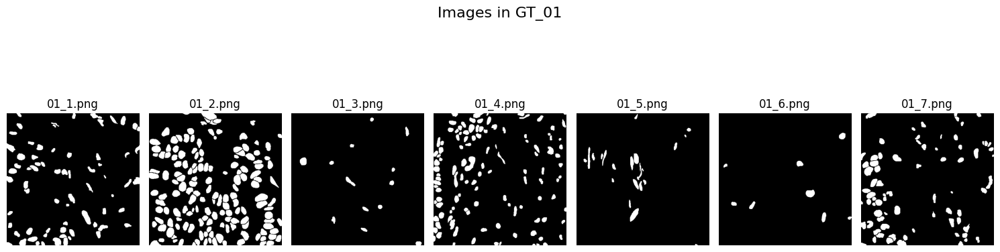

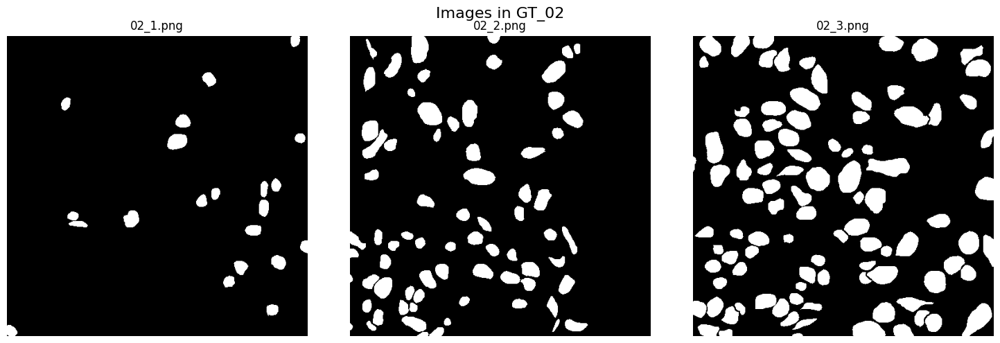

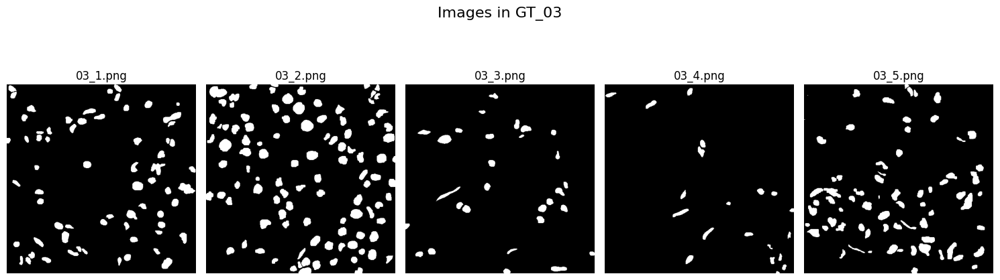

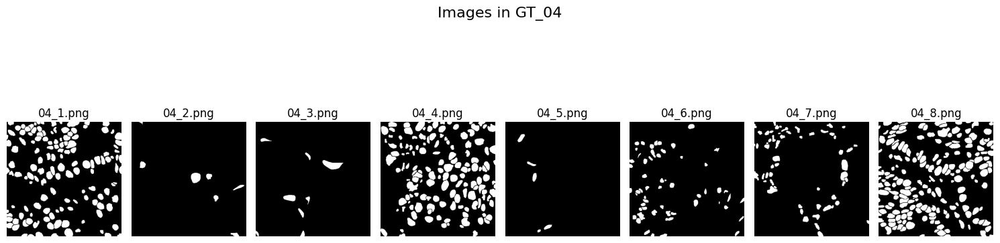

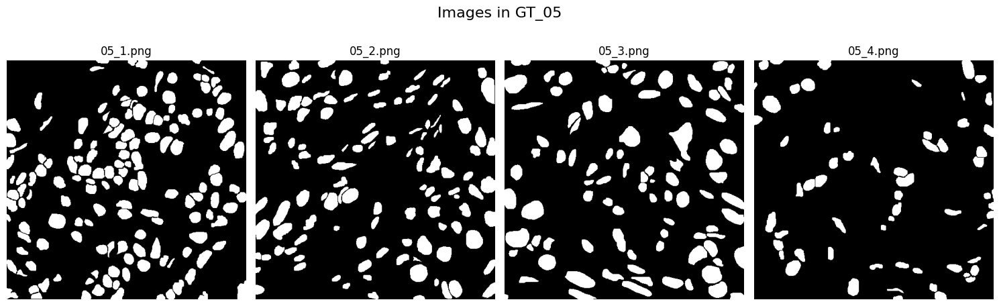

...

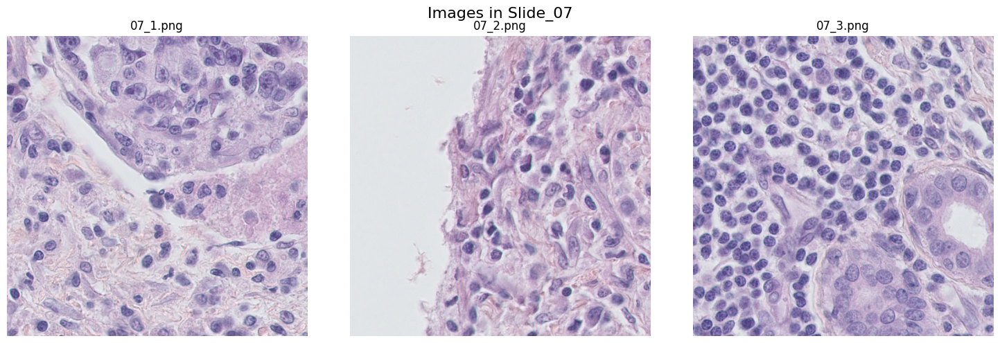

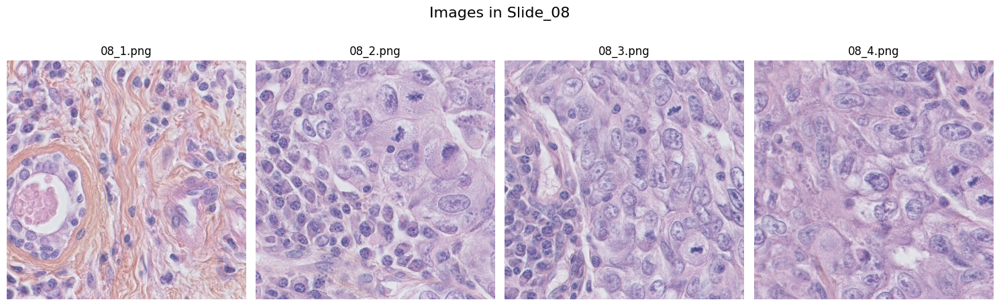

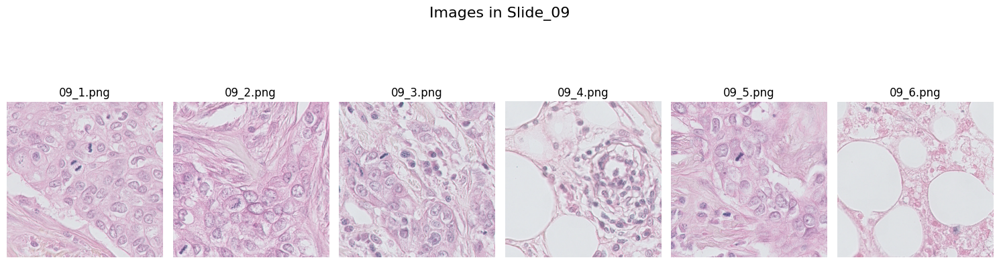

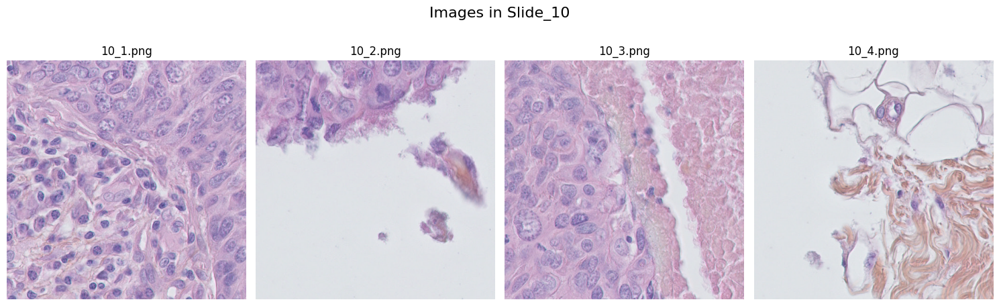

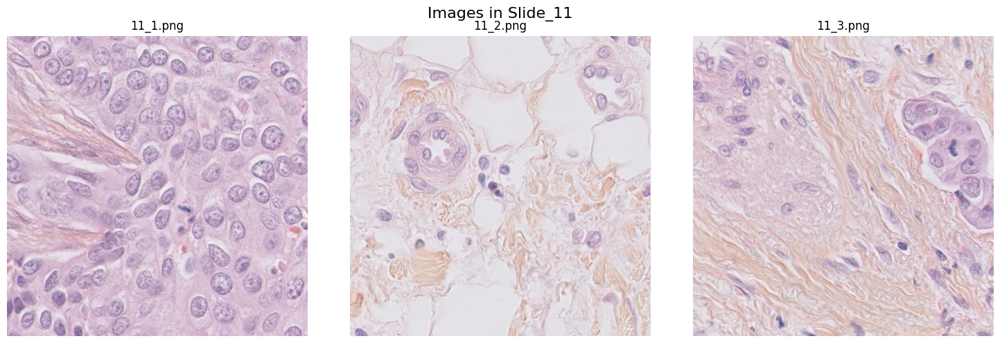

In [90]:
import os
import matplotlib.pyplot as plt
from PIL import Image

base_dir = './TNBC_NucleiSegmentation'

for subfolder in sorted(os.listdir(base_dir)):
    subfolder_path = os.path.join(base_dir, subfolder)
    
    if os.path.isdir(subfolder_path):
        images = sorted([img for img in os.listdir(subfolder_path) if img.endswith('.png')])
        
        plt.figure(figsize=(15, 5))
        plt.suptitle(f'Images in {subfolder}', fontsize=16)
        
        for i, image_name in enumerate(images):
            img_path = os.path.join(subfolder_path, image_name)
            img = Image.open(img_path)
            
            plt.subplot(1, len(images), i + 1)
            plt.imshow(img, cmap='gray')
            plt.axis('off')
            plt.title(image_name)
        
        plt.tight_layout()
        plt.show()


## 2. Define a transform
When you load your data, you need to define some transformation. For example, we want to convert image to the format [num_channels, spatial_dim_1, spatial_dim_2] because monai/pytorch use this format. We'll also need to convert the images to PyTorch tensors with transforms.ToTensor()

The following code lets you load image and the labels and define several steps to transform the data.


In [104]:
import torch
from monai.transforms import Compose, LoadImage, EnsureChannelFirst, ToTensor, NormalizeIntensity, ScaleIntensity
from monai.data import PILReader

image_trans = Compose(
    [
        LoadImage(image_only=True, reader=PILReader(converter=lambda image: image.convert("RGB"))),
        EnsureChannelFirst(),  
        ScaleIntensity(),
        NormalizeIntensity(),
        ToTensor(),
    ]
)

label_trans = Compose(
    [
        LoadImage(image_only=True),
        EnsureChannelFirst(),  
        ScaleIntensity(),
        ToTensor(),
    ]
)



## 3. Create dataset

The following class CellDataset allows us to create our dataset from "image_files" and "label_files" where:
- "image_files" is a list of image names
- "label_files" is the list of segmentation names respectively.

"im_trans" and "label_trans" are respectively the transforms for the images and their labels.




In [105]:
import torch

class CellDataset(torch.utils.data.Dataset):
    def __init__(self, image_files, label_files, im_trans, label_trans):
        self.image_files = image_files
        self.label_files = label_files
        self.im_trans = im_trans
        self.label_trans = label_trans

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, index):
        image = self.im_trans(self.image_files[index])
        label = self.label_trans(self.label_files[index])
        return image, label



By using this class, create your training dataset et your test dataset. Remember to check if your dataset is loaded correctly.

In [143]:
from glob import glob

# Trier les chemins pour garantir un alignement correct
inputs_paths = sorted(glob('./TNBC_NucleiSegmentation/Slide_*/*'))
labels_paths = sorted(glob('./TNBC_NucleiSegmentation/GT_*/*'))

# Découpage en ensembles d'entraînement et de test
train_inputs_paths = inputs_paths[8:]
test_inputs_paths = inputs_paths[:8]
train_labels_paths = labels_paths[8:]
test_labels_paths = labels_paths[:8]

# Vérifier que les longueurs correspondent
assert len(train_inputs_paths) == len(train_labels_paths), "Mismatch in training inputs and labels"
assert len(test_inputs_paths) == len(test_labels_paths), "Mismatch in testing inputs and labels"

# Créer les datasets
train_dataset = CellDataset(train_inputs_paths, train_labels_paths, image_trans, label_trans)
test_dataset = CellDataset(test_inputs_paths, test_labels_paths, image_trans, label_trans)

## 4. DataLoader

With the your dataset loaded, you have to pass it to a DataLoader. The torch.utils.data.DataLoader takes a dataset and returns batches of images and the corresponding labels. You can set various parameters like the batch size and if the data is shuffled after each epoch.


The following code let you create a data loader for the train dataset, do the same to create a test_loader on the test_dataset. Name it **test_load**


In [163]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=False)

## 5. Now, time to check your dataloader.

Execute the code following to check if your dataloader works correctly

In [164]:
import monai
im, seg = monai.utils.misc.first(train_loader)
im.shape

torch.Size([4, 3, 512, 512])

# II. Build your segmentation model with monai

Monai already has a UNet model architecture : https://docs.monai.io/en/stable/networks.html#unet

By using the monai.networks.nets module, build a UNet model for segmentation task in 2D. You'll have to choose the following parameters for the model:

1. dimensions (number of spatial dimensions)
2. in_channels (number of input channel)
3. out_channels (number of output channel)
4. channels
5. strides


In [165]:
import torch
from monai.networks.nets import UNet

# Define the parameters for the UNet model
dimensions = 2
in_channels = 3
out_channels = 1
channels = (4,16, 32, 64)
strides = (2, 2, 2, 2)

# Instantiate the UNet model
unet_model = UNet(
    spatial_dims=dimensions,
    in_channels=in_channels,
    out_channels=out_channels,
    channels=channels,
    norm="batch",
    num_res_units=4,
    strides=strides,
    dropout=0.1,
)

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
unet_model.to(device)

# Print the model architecture
print(unet_model)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv2d(3, 4, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (adn): ADN(
            (N): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (D): Dropout(p=0.1, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (adn): ADN(
            (N): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (D): Dropout(p=0.1, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit2): Convolution(
          (conv): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (adn): ADN(
            (N): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            

/Users/eithannakache/.pyenv/versions/3.10.14/lib/python3.10/site-packages/monai/networks/nets/unet.py:133: UserWarning: `len(strides) > len(channels) - 1`, the last 1 values of strides will not be used.
  warnings.warn(f"`len(strides) > len(channels) - 1`, the last {delta} values of strides will not be used.")


# III. Define your loss function and optimizer

For a segmentation prob, we usually use DiceLoss.
Using monai.losses.DiceLoss, define your loss function and store it in the variable named **loss_function**. The option sigmoid = True should be used.




In [166]:
from monai.losses import DiceLoss

loss_function = DiceLoss(sigmoid=True)

print(loss_function)

DiceLoss()


With torch.optim, define an optimizer for your model. Use the Adam optimiser



In [167]:
import torch.optim as optim

optimizer = optim.Adam(unet_model.parameters(), lr=1e-2)

print(optimizer)

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    weight_decay: 0
)


# IV. Trainning the model

This time, we have all ingredients to train a segmentation model: a model, an optimizer, train_loader and a loss function.  

Monai use a standard PyTorch program style for training a deep learning model.


The general process with Monai/Pytorch just for one learning step  as follows:

1. Load input and label of each batch.

2. Zero accumulated gradients with optimizer.zero_grad()

3. Compute the output from the model

4. Calculate the loss

5. Perform backprop with loss.backward()

6. Update the optimizer with optimizer.step()


Complete the following code so that it do the training


In [168]:
epoch_loss_values = list()
model = unet_model
for epoch in range(30):
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0].to(device), batch_data[1].to(device)

        optimizer.zero_grad()
        # print(f"Input shape: {inputs.shape}")

        #compute the model predictions using the model variable and inputs
        predictions = model(inputs)

        # compute the loss using the loss function, the predictions and labels
        loss = loss_function(predictions, labels)

        # use the backward method of the loss variable to  compute the gradient of the loss used to find the minimum of the loss function
        loss.backward()

        # call the step method of the optimizer
        optimizer.step()

        epoch_loss += loss.item()
        epoch_len = len(train_dataset) // train_loader.batch_size
        # print(f"{step}/{epoch_len}, train_loss: {loss.item():.4f}")


    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")


epoch 1 average loss: 0.7495
epoch 2 average loss: 0.6890
epoch 3 average loss: 0.6257
epoch 4 average loss: 0.5534
epoch 5 average loss: 0.4505
epoch 6 average loss: 0.3889
epoch 7 average loss: 0.3701
epoch 8 average loss: 0.4012
epoch 9 average loss: 0.3476
epoch 10 average loss: 0.3509
epoch 11 average loss: 0.3352
epoch 12 average loss: 0.3337
epoch 13 average loss: 0.3274
epoch 14 average loss: 0.3325
epoch 15 average loss: 0.3165
epoch 16 average loss: 0.3195
epoch 17 average loss: 0.3479
epoch 18 average loss: 0.3494
epoch 19 average loss: 0.3271
epoch 20 average loss: 0.3379
epoch 21 average loss: 0.3182
epoch 22 average loss: 0.3069
epoch 23 average loss: 0.3420
epoch 24 average loss: 0.3229
epoch 25 average loss: 0.3114
epoch 26 average loss: 0.3449
epoch 27 average loss: 0.2886
epoch 28 average loss: 0.2870
epoch 29 average loss: 0.2872
epoch 30 average loss: 0.2960


Display the prediction of your model on several image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.770504..3.04659].


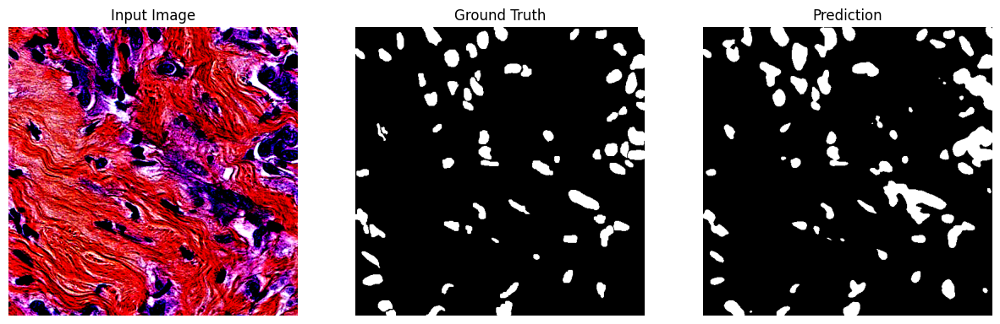

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.500396..3.211268].


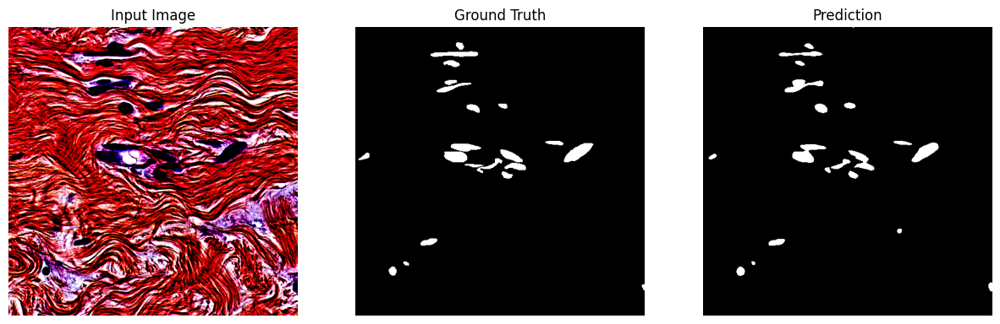

In [169]:
import matplotlib.pyplot as plt

# Function to display images and their predictions
def display_predictions(model, data_loader, device, num_images=5):
  model.eval()
  with torch.no_grad():
    for i, batch_data in enumerate(data_loader):
      if i >= num_images:
        break
      
      inputs, labels = batch_data[0].to(device), batch_data[1].to(device)
      
      predictions = (model(inputs) > 0.5).float()
      
      plt.figure(figsize=(15, 5))
      
      # Display input image
      plt.subplot(1, 3, 1)
      plt.imshow(inputs[0].cpu().numpy().transpose(1, 2, 0))
      plt.title('Input Image')
      plt.axis('off')
      
      # Display ground truth
      plt.subplot(1, 3, 2)
      plt.imshow(labels[0].cpu().numpy().squeeze(), cmap='gray')
      plt.title('Ground Truth')
      plt.axis('off')
      
      # Display prediction
      plt.subplot(1, 3, 3)
      plt.imshow(predictions[0].cpu().numpy().squeeze(), cmap='gray')
      plt.title('Prediction')
      plt.axis('off')
      
      plt.show()

# Display predictions on test dataset
display_predictions(model, test_loader, device)

Train another architecture (either another Unet architecture or find another segmentation model in the available models of Monai). Compare the results with the first model

In [171]:
from monai.networks.nets import AttentionUnet

# Define the parameters for the Attention UNet model
dimensions = 2
in_channels = 3
out_channels = 1
channels = (4,16, 32, 64)
strides = (2, 2, 2, 2)

# Instantiate the Attention UNet model
attention_unet_model = AttentionUnet(
    spatial_dims=dimensions,
    in_channels=in_channels,
    out_channels=out_channels,
    channels=channels,
    strides=strides,
    dropout=0.1,
)   

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
attention_unet_model.to(device)
print(attention_unet_model)

AttentionUnet(
  (model): Sequential(
    (0): ConvBlock(
      (conv): Sequential(
        (0): Convolution(
          (conv): Conv2d(3, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (adn): ADN(
            (N): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (D): Dropout(p=0.1, inplace=False)
            (A): ReLU()
          )
        )
        (1): Convolution(
          (conv): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (adn): ADN(
            (N): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (D): Dropout(p=0.1, inplace=False)
            (A): ReLU()
          )
        )
      )
    )
    (1): AttentionLayer(
      (attention): AttentionBlock(
        (W_g): Sequential(
          (0): Convolution(
            (conv): Conv2d(4, 2, kernel_size=(1, 1), stride=(1, 1))
          )
          (1): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, t

In [172]:
# Define the loss function
loss_function = DiceLoss(sigmoid=True)

# Define the optimizer
optimizer = optim.Adam(attention_unet_model.parameters(), lr=1e-2)

In [173]:
epoch_loss_values = list()
model = attention_unet_model
for epoch in range(30):
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0].to(device), batch_data[1].to(device)

        optimizer.zero_grad()
        # print(f"Input shape: {inputs.shape}")

        #compute the model predictions using the model variable and inputs
        predictions = model(inputs)

        # compute the loss using the loss function, the predictions and labels
        loss = loss_function(predictions, labels)

        # use the backward method of the loss variable to  compute the gradient of the loss used to find the minimum of the loss function
        loss.backward()

        # call the step method of the optimizer
        optimizer.step()

        epoch_loss += loss.item()
        epoch_len = len(train_dataset) // train_loader.batch_size
        # print(f"{step}/{epoch_len}, train_loss: {loss.item():.4f}")


    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")


epoch 1 average loss: 0.7241
epoch 2 average loss: 0.6801
epoch 3 average loss: 0.6399
epoch 4 average loss: 0.5987
epoch 5 average loss: 0.5713
epoch 6 average loss: 0.5540
epoch 7 average loss: 0.5242
epoch 8 average loss: 0.5300
epoch 9 average loss: 0.4783
epoch 10 average loss: 0.4698
epoch 11 average loss: 0.4532
epoch 12 average loss: 0.4476
epoch 13 average loss: 0.4376
epoch 14 average loss: 0.4210
epoch 15 average loss: 0.4241
epoch 16 average loss: 0.4120
epoch 17 average loss: 0.4058
epoch 18 average loss: 0.3973
epoch 19 average loss: 0.4020
epoch 20 average loss: 0.3927
epoch 21 average loss: 0.3726
epoch 22 average loss: 0.3700
epoch 23 average loss: 0.3682
epoch 24 average loss: 0.3537
epoch 25 average loss: 0.3474
epoch 26 average loss: 0.3441
epoch 27 average loss: 0.3437
epoch 28 average loss: 0.3592
epoch 29 average loss: 0.3241
epoch 30 average loss: 0.3317


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-6.770504..3.04659].


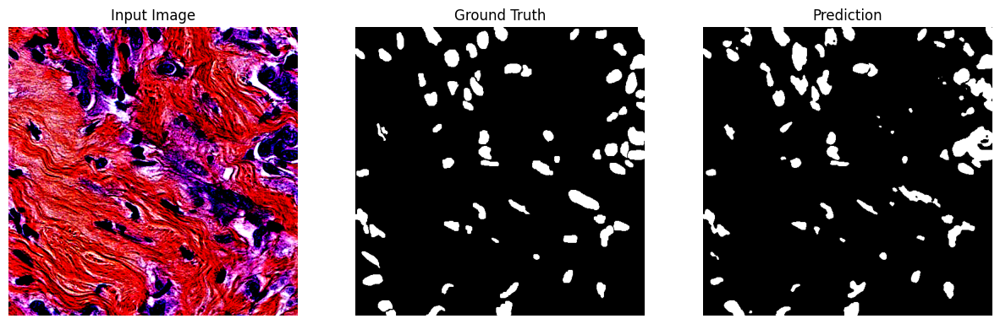

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-9.500396..3.211268].


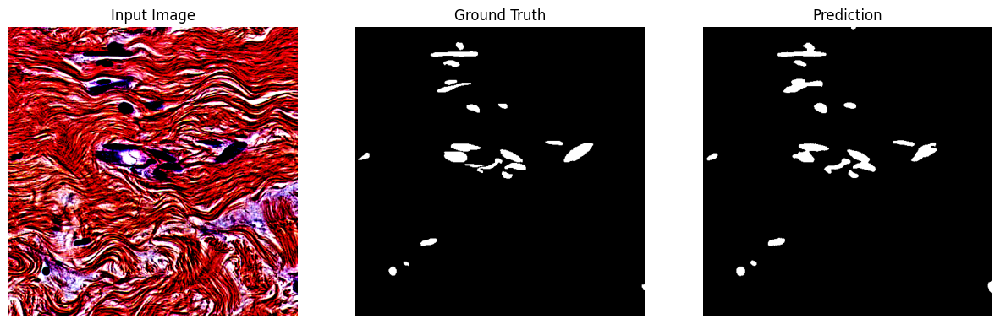

In [174]:
display_predictions(model, test_loader, device)